## Chicago Light Color: Initial Data Exploration
**Date:** 2026-09-23
**Data:** SDGSAT-1 (satellite code `KX10`) Glimmer Imager for Urbanization (GIU), scene `KX10_GIU_20250916_W89.00_N41.66_202500097282_L4A`

This notebook is a first look at the raw nighttime-light scene for the new Chicago light-color project. It covers:

1. What files we have (inventory, sizes, raster structure)
2. Acquisition metadata and radiometric calibration
3. Spatial coverage: where the two cameras (A and B) land and where Chicago sits
4. Panchromatic product (`LH`: PL / PH / HDR bands, 10 m)
5. Color product (`RGB`: R / G / B bands, 40 m)
6. **Light color**: band ratios as a proxy for lamp type (for example warm HPS vs. cool white LED)
7. Urban–rural gradients of brightness and color from downtown Chicago
8. Consistency checks: 10 m panchromatic vs. 40 m RGB, camera A vs. camera B
9. Data-quality notes and open questions for the project meeting

Processing conventions follow the mentor notebook (`envir-layer-processing_building-density (1).ipynb`): rasterio for I/O, gain/bias from `calib.xml`, log10 radiance for display.
Large rasters (the 10 m `LH` files are ~0.8 billion pixels per band) are read through their built-in overviews or through windows over Chicago, so nothing here needs more than a few GB of RAM.

### 0. Setup

In [3]:
import os, sys, glob
from datetime import datetime, timezone
from zoneinfo import ZoneInfo

# pyproj needs the proj.db that belongs to this kernel's environment.
# If PROJ_DATA points to another conda env, coordinate transforms fail with
# "no database context specified", so point it at this environment's copy.
proj_dir = os.path.join(sys.prefix, "share", "proj")
if os.path.exists(os.path.join(proj_dir, "proj.db")):
    os.environ["PROJ_DATA"] = proj_dir
    os.environ["PROJ_LIB"] = proj_dir

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import rasterio as rio
import xml.etree.ElementTree as ET
from rasterio.enums import Resampling
from rasterio.windows import from_bounds
from rasterio.warp import reproject, transform_bounds
from pyproj import Transformer
from matplotlib.colors import LogNorm, TwoSlopeNorm
from matplotlib.patches import Rectangle

In [7]:
import sys, os, rasterio, pyproj
print(sys.executable)
print("PROJ_DATA =", os.environ.get("PROJ_DATA"))
print("rasterio", rasterio.__version__, "PROJ", rasterio.__proj_version__)
print("pyproj data dir:", pyproj.datadir.get_data_dir())

/opt/anaconda3/bin/python
PROJ_DATA = /opt/miniconda3/share/proj
rasterio 1.4.3 PROJ 9.4.1
pyproj data dir: /opt/anaconda3/lib/python3.13/site-packages/pyproj/proj_dir/share/proj


In [11]:
# paths
DATA_DIR = "KX10_GIU_20250916_W89.00_N41.66_202500097282_L4A"
PID = "KX10_GIU_20250916_W89.00_N41.66_202500097282_L4A"
FIG_DIR = "figures"
os.makedirs(FIG_DIR, exist_ok=True)

def fp(suffix):
    return os.path.join(DATA_DIR, PID + suffix)

a_lh, b_lh = fp("_A_LH.tif"), fp("_B_LH.tif")
a_rgb, b_rgb = fp("_A_RGB.tif"), fp("_B_RGB.tif")
meta_xml, calib_xml = fp(".meta.xml"), fp(".calib.xml")

# study area: City of Chicago bounding box (lon/lat) and the Loop as "downtown"
CHI_BBOX_LL = (-87.94, 41.64, -87.52, 42.03)   # (west, south, east, north)
LOOP_LL = (-87.6278, 41.8819)
CRS_UTM = "EPSG:32616"                           # native CRS of all rasters

to_utm = Transformer.from_crs("EPSG:4326", CRS_UTM, always_xy=True)
CHI_BBOX = transform_bounds("EPSG:4326", CRS_UTM, *CHI_BBOX_LL)
LOOP = to_utm.transform(*LOOP_LL)
print("Chicago bbox (UTM 16N, m):", [round(v) for v in CHI_BBOX])
print("Loop (UTM 16N, m):", [round(v) for v in LOOP])

ERROR 1: PROJ: internal_proj_create_from_database: /opt/miniconda3/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


CRSError: The EPSG code is unknown. PROJ: internal_proj_create_from_database: /opt/miniconda3/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.

In [ ]:
# plotting style: quiet axes, one palette used throughout
plt.rcParams.update({
    "figure.dpi": 110, "savefig.dpi": 150, "savefig.bbox": "tight",
    "axes.spines.top": False, "axes.spines.right": False,
    "axes.grid": True, "grid.alpha": 0.25, "grid.linestyle": "--",
    "axes.titleweight": "bold", "axes.titlesize": 11, "font.size": 9,
})
C_A, C_B, C_3 = "#2a78d6", "#eb6834", "#1baf7a"               # categorical: camera A, camera B, third series
BAND_COLORS = {"R": "#e34948", "G": "#008300", "B": "#2a78d6",   # semantic band colors
               "PL": "#2a78d6", "PH": "#eb6834", "HDR": "#1baf7a"}
NTL_CMAP = "magma"      # sequential: brightness
RATIO_CMAP = "RdBu"     # diverging for B/G: high (cooler/whiter) = blue, low (warmer) = red, white midpoint

def savefig(fig, name):
    fig.savefig(os.path.join(FIG_DIR, name))

def km(v):
    return np.asarray(v) / 1000.0

### 1. File inventory
What is in the scene folder, and how big each piece is.

In [ ]:
ROLE = {
    "_A_LH.tif": "Camera A panchromatic (PL, PH, HDR), 10 m",
    "_B_LH.tif": "Camera B panchromatic (PL, PH, HDR), 10 m",
    "_A_RGB.tif": "Camera A color (R, G, B), 40 m",
    "_B_RGB.tif": "Camera B color (R, G, B), 40 m",
    ".tif.ovr": "Pyramid overviews (fast low-res reads)",
    ".tif.aux.xml": "GDAL sidecar: full-res histograms + stats",
    ".png.aux.xml": "GDAL sidecar for the mosaic PNG",
    ".png.ovr": "Overviews for the mosaic PNG",
    ".meta.xml": "Acquisition metadata",
    ".calib.xml": "Radiometric calibration (gain/bias)",
    ".browse.png": "Quicklook image",
    ".thumb.png": "Thumbnail",
    ".png": "A+B mosaic color image (display only)",
}

def role_of(name):
    for key in sorted(ROLE, key=len, reverse=True):
        if name.endswith(key):
            return ROLE[key]
    return ""

files = sorted(os.listdir(DATA_DIR))
inv = pd.DataFrame({
    "file": [f.replace(PID, "…") for f in files],
    "size_MB": [os.path.getsize(os.path.join(DATA_DIR, f)) / 1e6 for f in files],
    "role": [role_of(f) for f in files],
}).sort_values("size_MB", ascending=False, ignore_index=True)
print(f"{len(inv)} files, {inv.size_MB.sum():.0f} MB total")
inv.style.format({"size_MB": "{:.2f}"})

23 files, 297 MB total


,file,size_MB,role
0,…_B_LH.tif,144.43,"Camera B panchromatic (PL, PH, HDR), 10 m"
1,…_B_LH.tif.ovr,51.38,Pyramid overviews (fast low-res reads)
2,…_A_LH.tif,47.03,"Camera A panchromatic (PL, PH, HDR), 10 m"
3,…_B_RGB.tif,24.91,"Camera B color (R, G, B), 40 m"
4,…_A_LH.tif.ovr,15.64,Pyramid overviews (fast low-res reads)
5,…_A_RGB.tif,5.96,"Camera A color (R, G, B), 40 m"
6,….png,4.19,A+B mosaic color image (display only)
7,….png.ovr,1.33,Overviews for the mosaic PNG
8,….browse.png,1.23,Quicklook image
9,…_B_RGB.browse.png,0.37,Quicklook image


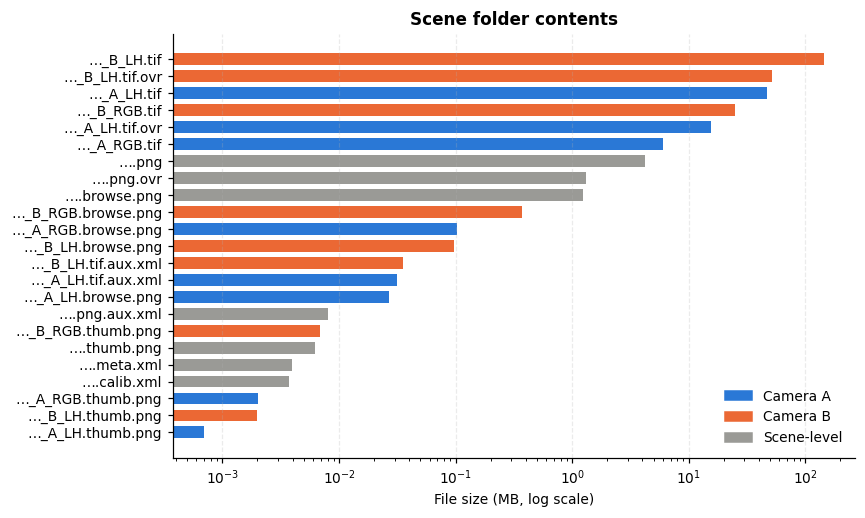

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))
d = inv.sort_values("size_MB")
colors = [C_B if "B_" in f else C_A if "A_" in f else "#9a9a96" for f in d.file]
ax.barh(d.file, d.size_MB, color=colors, height=0.7)
ax.set_xscale("log")
ax.set_xlabel("File size (MB, log scale)")
ax.set_title("Scene folder contents")
ax.grid(axis="y", visible=False)
from matplotlib.patches import Patch
ax.legend(handles=[Patch(color=C_A, label="Camera A"), Patch(color=C_B, label="Camera B"),
                   Patch(color="#9a9a96", label="Scene-level")], loc="lower right", frameon=False)
savefig(fig, "01_file_inventory.png"); plt.show()

In [ ]:
# raster structure of the four GeoTIFFs
rows = []
for label, path in [("A_LH", a_lh), ("B_LH", b_lh), ("A_RGB", a_rgb), ("B_RGB", b_rgb)]:
    with rio.open(path) as src:
        rows.append({
            "product": label, "width": src.width, "height": src.height,
            "Mpx/band": src.width * src.height / 1e6, "bands": src.count,
            "band names": src.descriptions if any(src.descriptions) else "(none: R,G,B per meta.xml)",
            "dtype": src.dtypes[0], "res_m": src.res[0], "crs": src.crs.to_string(),
            "nodata": src.nodata, "overviews": src.overviews(1),
            "extent_km": f"{(src.bounds.right-src.bounds.left)/1e3:.0f} x {(src.bounds.top-src.bounds.bottom)/1e3:.0f}",
        })
raster_info = pd.DataFrame(rows)
raster_info

,product,width,height,Mpx/band,bands,band names,dtype,res_m,crs,nodata,overviews,extent_km
0,A_LH,22549,36773,829.194377,3,"(PL, PH, HDR)",uint16,10.0,EPSG:32616,0.0,"[2, 4, 8, 16, 32]",225 x 368
1,B_LH,22376,37272,833.998272,3,"(PL, PH, HDR)",uint16,10.0,EPSG:32616,0.0,"[2, 4, 8, 16, 32]",224 x 373
2,A_RGB,5621,9118,51.252278,3,"(none: R,G,B per meta.xml)",uint16,40.0,EPSG:32616,0.0,[],225 x 365
3,B_RGB,5579,9239,51.544381,3,"(none: R,G,B per meta.xml)",uint16,40.0,EPSG:32616,0.0,[],223 x 370


**Notes**
- All four rasters are `uint16` in **UTM 16N (EPSG:32616)**, with **nodata = 0** set in the file.
- `LH` = panchromatic at 10 m, three bands: **PL** (low gain), **PH** (high gain), **HDR** (fused high dynamic range). The mentor notebook uses HDR (band 3).
- `RGB` = color at 40 m. Band names are not stored in the TIFF, but `meta.xml` gives the order as `R,G,B`.
- The scene is split into two camera strips (A = west, B = east). Only the `LH` files have overviews.

### 2. Acquisition metadata and calibration

In [ ]:
meta = ET.parse(meta_xml).getroot()
t = lambda p: meta.findtext(p)

t_utc = datetime.fromisoformat(t(".//CenterTime/RGB/Bcamera")).replace(tzinfo=timezone.utc)
t_local = t_utc.astimezone(ZoneInfo("America/Chicago"))

meta_tbl = pd.Series({
    "Product ID": t(".//ProductID"),
    "Level": t(".//ProductLevel"),
    "Satellite / sensor": f"{t('.//SatelliteID')} (SDGSAT-1) / {t('.//SensorID')}",
    "Center time (UTC)": t_utc.strftime("%Y-%m-%d %H:%M:%S"),
    "Center time (Chicago local)": t_local.strftime("%Y-%m-%d %H:%M %Z (%A)"),
    "Solar zenith (deg)": t(".//SolarZenith") + "  (>108° means astronomical night)",
    "Pass direction": t(".//PassDirection"),
    "GSD (pan, RGB) m": t(".//GroundSampleDistance"),
    "Bit depth": "12-bit data stored as uint16 (DN 0–4095)",
    "Resampling": t(".//ResampleMode"),
    "Calibration version": t(".//CalibrationParamVersion"),
    "Center lat/lon": f"{t('.//GeodeticInfo/CenterLatitude')}, {t('.//GeodeticInfo/CenterLongitude')}",
}, name="value")
meta_tbl.to_frame()

,value
Product ID,KX10_GIU_20250916_W89.00_N41.66_202500097282_L4A
Level,L4A
Satellite / sensor,KX10 (SDGSAT-1) / GIU
Center time (UTC),2025-09-16 02:31:19
Center time (Chicago local),2025-09-15 21:31 CDT (Monday)
Solar zenith (deg),116.791151 (>108° means astronomical night)
Pass direction,ASCENDING
"GSD (pan, RGB) m","10.000000,40.000000"
Bit depth,12-bit data stored as uint16 (DN 0–4095)
Resampling,Cubic


In [ ]:
# gain/bias for the GIU bands (same parsing as the mentor notebook)
with open(calib_xml, "r", encoding="gb2312") as f:
    calib = ET.fromstring(f.read())
giu = calib.find(".//GIU")
print("Formula:", giu.findtext("formula_L"), "| unit: W·m⁻²·sr⁻¹·μm⁻¹")
print("Band centers listed in calib.xml:", giu.findtext("bandsIDList"), "->", giu.findtext("bandsCenter"), "nm")

CAL = {}
for band, tag in [("R", "RED"), ("G", "GREEN"), ("B", "BLUE"), ("PL", "PL"), ("PH", "PH")]:
    CAL[band] = (float(giu.findtext(f".//RADIANCE_GAIN_BAND_{tag}")),
                 float(giu.findtext(f".//RADIANCE_BIAS_BAND_{tag}")))
# HDR has no coefficient of its own: follow the mentor notebook and average PL and PH
CAL["HDR"] = (0.5 * (CAL["PL"][0] + CAL["PH"][0]), 0.5 * (CAL["PL"][1] + CAL["PH"][1]))

cal_tbl = pd.DataFrame(CAL, index=["gain", "bias"]).T
cal_tbl["radiance at DN=1"] = cal_tbl.gain + cal_tbl.bias
cal_tbl["radiance at DN=4095"] = cal_tbl.gain * 4095 + cal_tbl.bias
cal_tbl.style.format("{:.3e}")

Formula: L = DN*GAIN+BIAS | unit: W·m⁻²·sr⁻¹·μm⁻¹
Band centers listed in calib.xml: R, G, B, PL, PH -> 474,567,758,675,675 nm


,gain,bias,radiance at DN=1,radiance at DN=4095
R,1.027e-05,9.925e-06,2.020e-05,4.208e-02
G,4.178e-06,6.084e-06,1.026e-05,1.711e-02
B,7.012e-06,1.368e-05,2.069e-05,2.873e-02
PL,6.742e-05,1.678e-05,8.420e-05,2.761e-01
PH,6.437e-05,1.839e-05,8.276e-05,2.636e-01
HDR,6.589e-05,1.759e-05,8.348e-05,2.698e-01


**Notes**
- The image was taken around **9:30 pm local time on Monday, Sept 15, 2025** (02:31 UTC Sept 16). This matters for light color: some lighting (commercial, sports, decorative) switches off later at night, so one overpass time is a snapshot.
- **Band centers in `calib.xml` look wrong.** They are listed as R = 474 nm, G = 567 nm, B = 758 nm. That order looks like blue and red are swapped (GIU's published bands are roughly B ≈ 424–526, G ≈ 506–612, R ≈ 600–894 nm). The data agree with `meta.xml`'s R,G,B order: band 3 is the dimmest, as expected for blue under warm lighting. Worth confirming.
- HDR has no gain/bias of its own. Averaging PL and PH follows the mentor notebook's convention, which should be checked against the SDGSAT-1 product documentation.

### 3. Spatial coverage
Which areas each camera covers, and where Chicago sits in the scene.

In [ ]:
def read_decimated(path, factor, bands=None, resampling=Resampling.nearest):
    # Read a raster at 1/factor resolution. Uses overviews when present.
    with rio.open(path) as src:
        h, w = src.height // factor, src.width // factor
        idx = bands or list(range(1, src.count + 1))
        arr = src.read(idx, out_shape=(len(idx), h, w), resampling=resampling)
        b = src.bounds
    return arr, (b.left, b.right, b.bottom, b.top)

cov = {}
for label, path in [("A", a_rgb), ("B", b_rgb)]:
    arr, ext = read_decimated(path, 8, bands=[2])
    cov[label] = (arr[0] > 0, ext)

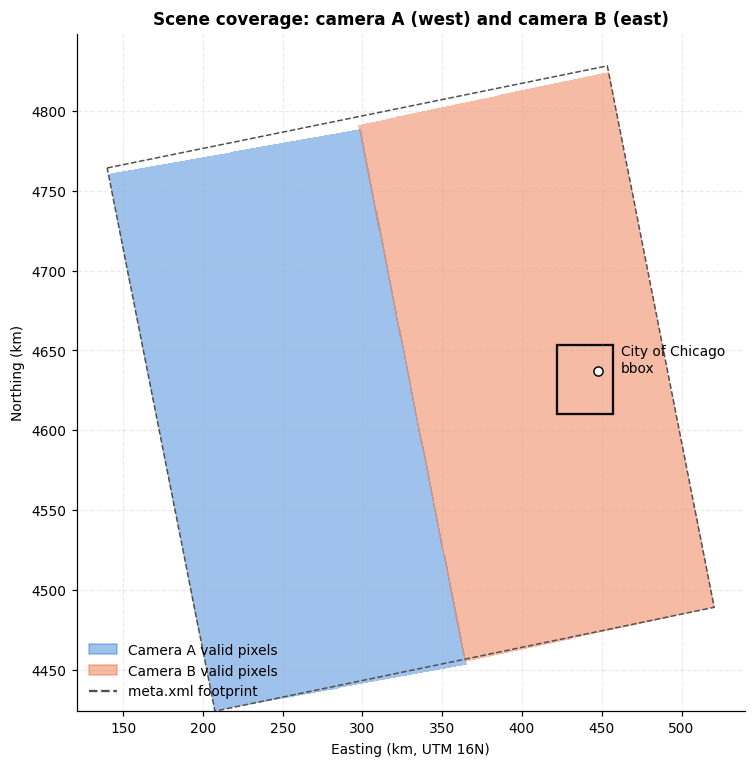

Overlap of A and B in easting: 297–366 km (~68 km wide)
Chicago is entirely inside camera B, so camera B is the main input for the city.


In [ ]:
# footprint polygon from meta.xml (lat/lon corners) projected to UTM
fpi = meta.find(".//FootprintInfo")
corners = [(float(fpi.findtext(f"{c}Longitude")), float(fpi.findtext(f"{c}Latitude")))
           for c in ["TopLeft", "TopRight", "BottomRight", "BottomLeft", "TopLeft"]]
fx, fy = to_utm.transform(*zip(*corners))

fig, ax = plt.subplots(figsize=(8, 8))
for label, color in [("A", C_A), ("B", C_B)]:
    m, ext = cov[label]
    ext_km = [km(v) for v in ext]
    ax.imshow(np.where(m, 1.0, np.nan), extent=ext_km, cmap=mpl.colors.ListedColormap([color]),
              alpha=0.45, interpolation="nearest")
ax.plot(km(fx), km(fy), color="#52514e", lw=1, ls="--", label="meta.xml footprint")
x0, y0, x1, y1 = CHI_BBOX
ax.add_patch(Rectangle((km(x0), km(y0)), km(x1 - x0), km(y1 - y0), fill=False, ec="#0b0b0b", lw=1.5))
ax.text(km(x1) + 5, km(y1), "City of Chicago\nbbox", va="top", fontsize=9)
ax.plot(km(LOOP[0]), km(LOOP[1]), "o", ms=6, mfc="white", mec="#0b0b0b")
from matplotlib.patches import Patch
ax.legend(handles=[Patch(color=C_A, alpha=0.45, label="Camera A valid pixels"),
                   Patch(color=C_B, alpha=0.45, label="Camera B valid pixels"),
                   mpl.lines.Line2D([], [], color="#52514e", ls="--", label="meta.xml footprint")],
          loc="lower left", frameon=False)
ax.set_xlabel("Easting (km, UTM 16N)"); ax.set_ylabel("Northing (km)")
ax.set_title("Scene coverage: camera A (west) and camera B (east)")
ax.set_aspect("equal")
savefig(fig, "03_coverage.png"); plt.show()

mA, extA = cov["A"]; mB, extB = cov["B"]
print(f"Overlap of A and B in easting: {extB[0]/1e3:.0f}–{extA[1]/1e3:.0f} km "
      f"(~{(extA[1]-extB[0])/1e3:.0f} km wide)")
print("Chicago is entirely inside camera B, so camera B is the main input for the city.")

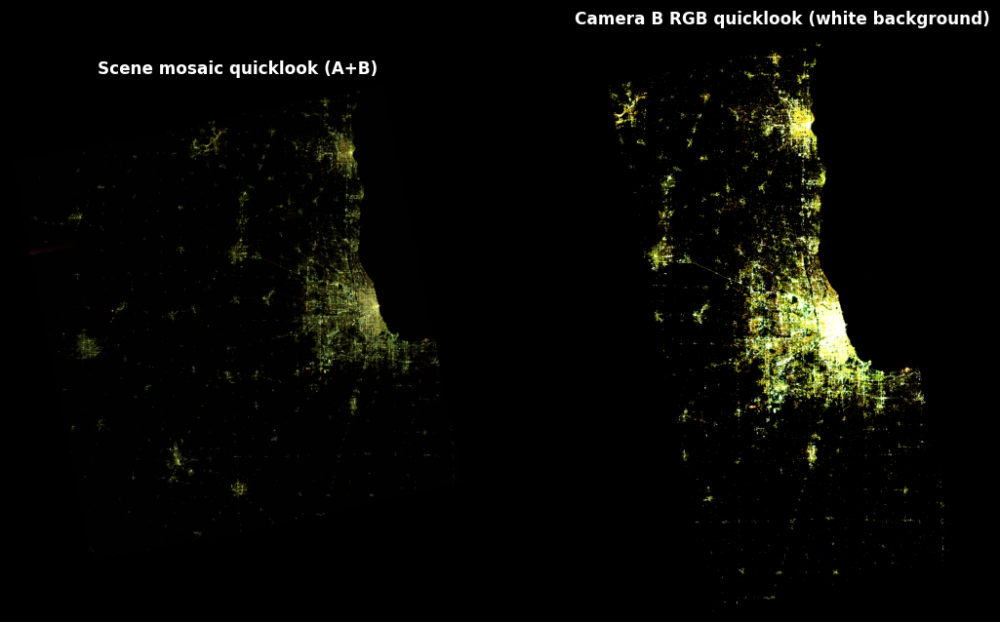

In [ ]:
# quicklooks supplied with the product
fig, axes = plt.subplots(1, 2, figsize=(12, 7), facecolor="black")
for ax, (name, title) in zip(axes, [(".browse.png", "Scene mosaic quicklook (A+B)"),
                                    ("_B_RGB.browse.png", "Camera B RGB quicklook (white background)")]):
    ax.imshow(plt.imread(fp(name))); ax.set_title(title, color="white"); ax.axis("off")
plt.show()

### 4. Panchromatic product (`LH`, 10 m): PL, PH, HDR
The `.tif.aux.xml` files hold **exact full-resolution histograms** (4096 DN bins) for every band. That lets us describe all ~0.8 billion pixels per band without reading them.

In [ ]:
def aux_histograms(tif_path):
    # Parse the full-res DN histograms and band names from a GDAL .aux.xml sidecar.
    root = ET.parse(tif_path + ".aux.xml").getroot()
    out = {}
    for b in root.findall("PAMRasterBand"):
        name = b.findtext("Description") or f"band{b.get('band')}"
        counts = np.array(b.findtext(".//HistCounts").split("|"), dtype=np.int64)
        out[name] = counts  # index = DN (bucket width 1, DN 0..4095)
    return out

def hist_summary(counts, n_total):
    valid = counts[1:].sum()                       # DN 0 is nodata (excluded from GDAL stats)
    cdf = np.cumsum(counts) / counts.sum()
    q = lambda p: int(np.searchsorted(cdf, p))
    return {"valid px (M)": valid / 1e6,
            "nodata % of frame": 100 * (n_total - valid) / n_total,
            "DN=1 % (dark floor)": 100 * counts[1] / valid,
            "DN>1 % (any light)": 100 * counts[2:].sum() / valid,
            "DN≥100 % (bright)": 100 * counts[100:].sum() / valid,
            "DN=4095 % (saturated)": 100 * counts[4095] / valid,
            "saturated px": int(counts[4095]),
            "p50": q(0.5), "p90": q(0.9), "p99": q(0.99), "p99.9": q(0.999)}

lh_hist, lh_rows = {}, []
for cam, path in [("A", a_lh), ("B", b_lh)]:
    with rio.open(path) as src:
        n_total = src.width * src.height
    for band, counts in aux_histograms(path).items():
        lh_hist[(cam, band)] = counts
        lh_rows.append({"camera": cam, "band": band, **hist_summary(counts, n_total)})
lh_stats = pd.DataFrame(lh_rows).set_index(["camera", "band"])
lh_stats.style.format(precision=3)

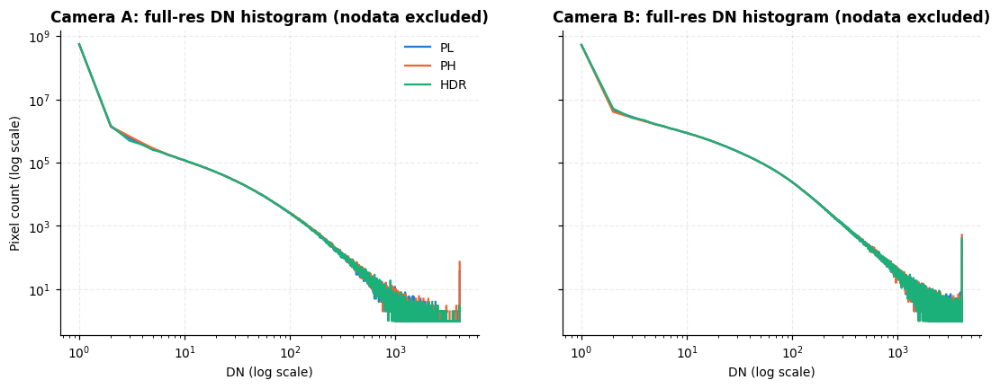

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
dn = np.arange(4096)
for ax, cam in zip(axes, ["A", "B"]):
    for band in ["PL", "PH", "HDR"]:
        c = lh_hist[(cam, band)].astype(float); c[c == 0] = np.nan
        ax.plot(dn[1:], c[1:], lw=1.5, color=BAND_COLORS[band], label=band)
    ax.set_xscale("log"); ax.set_yscale("log")
    ax.set_xlabel("DN (log scale)"); ax.set_title(f"Camera {cam}: full-res DN histogram (nodata excluded)")
axes[0].set_ylabel("Pixel count (log scale)")
axes[0].legend(frameon=False)
savefig(fig, "04_lh_histograms.png"); plt.show()

**Reading the histograms**
- About **94% of valid pixels sit at DN = 1**, the dark floor. The scene is mostly unlit land and Lake Michigan, so light is a sparse signal and summary stats (mean, median) over the whole frame are dominated by darkness.
- Pixel counts fall off smoothly (roughly a power law) from dim to bright. The spike at **DN = 4095** is saturation (airports, stadiums, industrial flares). The mentor notebook notes that these are real bright spots and should be kept.
- **Heads-up on the mentor pipeline:** the TIFFs mark DN = 0 as nodata. After DN → radiance conversion, 0 becomes the bias value (≈1.76e-5), which is exactly the *min* and *Q25* printed in the mentor notebook. The ~34% nodata pixels outside the swath were probably counted as very dark pixels in those whole-scene stats. The 100 m grid means inside Chicago are unlikely to be affected.

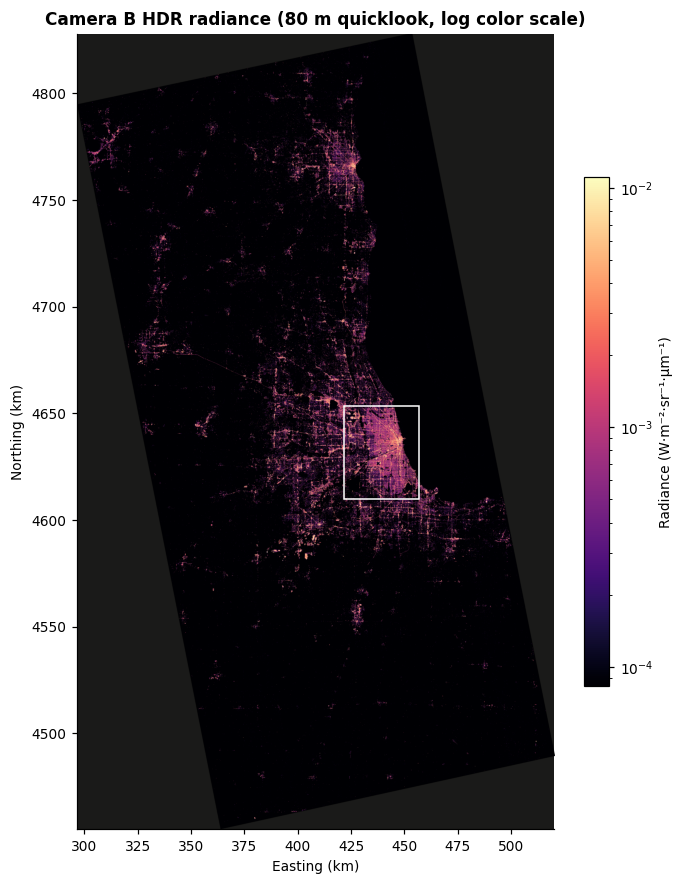

In [ ]:
# scene-wide HDR map from overviews (factor 8 -> 80 m)
hdr_dec, hdr_ext = read_decimated(b_lh, 8, bands=[3], resampling=Resampling.average)
hdr_dec = hdr_dec[0].astype("float32")
g, b0 = CAL["HDR"]
hdr_rad = np.where(hdr_dec > 0, hdr_dec * g + b0, np.nan)

fig, ax = plt.subplots(figsize=(7, 10), facecolor="white")
im = ax.imshow(hdr_rad, extent=[km(v) for v in hdr_ext], cmap=NTL_CMAP,
               norm=LogNorm(vmin=np.nanpercentile(hdr_rad, 50), vmax=np.nanpercentile(hdr_rad, 99.9)))
ax.add_patch(Rectangle((km(x0), km(y0)), km(x1 - x0), km(y1 - y0), fill=False, ec="white", lw=1))
ax.set_facecolor("#1a1a19"); ax.grid(False)
ax.set_title("Camera B HDR radiance (80 m quicklook, log color scale)")
ax.set_xlabel("Easting (km)"); ax.set_ylabel("Northing (km)")
plt.colorbar(im, ax=ax, shrink=0.6, label="Radiance (W·m⁻²·sr⁻¹·μm⁻¹)")
savefig(fig, "04_hdr_scene.png"); plt.show()

Chicago LH window: (3, 4360, 3524) = 15.4 M px per band at 10 m


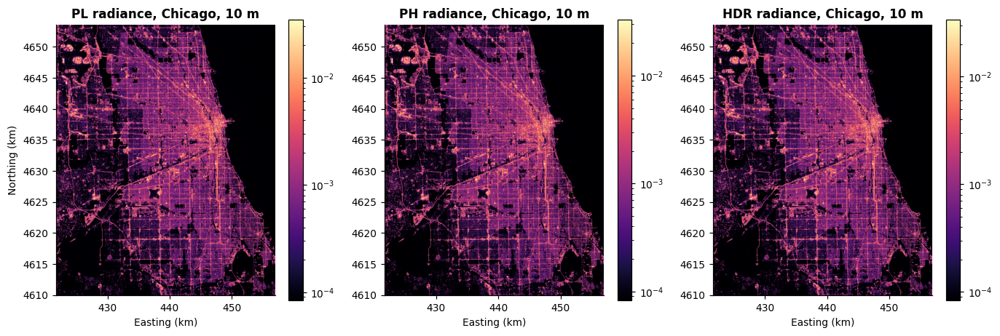

In [ ]:
# full 10 m read of all three LH bands over Chicago
with rio.open(b_lh) as src:
    win = from_bounds(*CHI_BBOX, transform=src.transform).round_offsets().round_lengths()
    lh_chi = src.read(window=win).astype("float32")      # (3, rows, cols)
    lh_chi_tf = src.window_transform(win)
    lh_chi_ext = rio.windows.bounds(win, src.transform)
lh_chi[lh_chi == 0] = np.nan
lh_ext = [lh_chi_ext[0], lh_chi_ext[2], lh_chi_ext[1], lh_chi_ext[3]]
print("Chicago LH window:", lh_chi.shape, f"= {lh_chi[0].size/1e6:.1f} M px per band at 10 m")

rad_lh = {}
for i, band in enumerate(["PL", "PH", "HDR"]):
    g, b0 = CAL[band]
    rad_lh[band] = lh_chi[i] * g + b0

fig, axes = plt.subplots(1, 3, figsize=(15, 6.5))
for ax, band in zip(axes, ["PL", "PH", "HDR"]):
    r = rad_lh[band]
    im = ax.imshow(r, extent=[km(v) for v in lh_ext], cmap=NTL_CMAP,
                   norm=LogNorm(vmin=np.nanpercentile(r, 5), vmax=np.nanpercentile(r, 99.9)))
    ax.set_facecolor("#1a1a19"); ax.grid(False)
    ax.set_title(f"{band} radiance, Chicago, 10 m"); ax.set_xlabel("Easting (km)")
    plt.colorbar(im, ax=ax, shrink=0.7)
axes[0].set_ylabel("Northing (km)")
savefig(fig, "04_lh_chicago_bands.png"); plt.show()

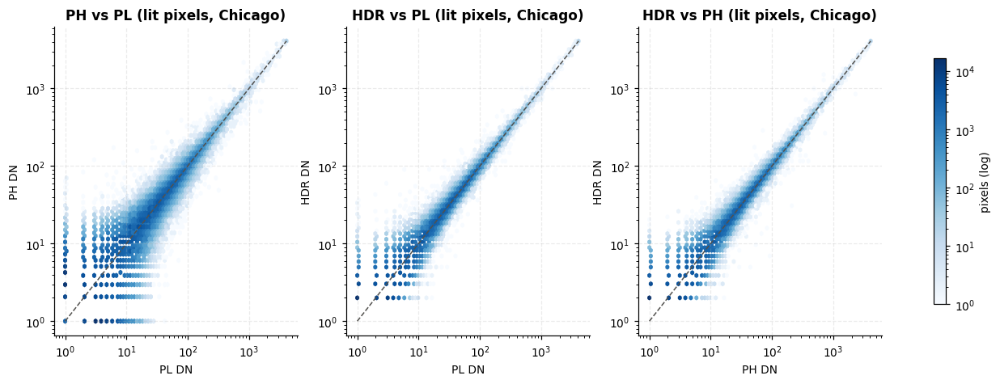

Saturated 10 m pixels inside Chicago bbox: {'PL': 144, 'PH': 217, 'HDR': 177}


In [ ]:
# how do the three pan bands relate? (random sample of lit pixels)
rng = np.random.default_rng(0)
dn_pl, dn_ph, dn_hdr = [lh_chi[i].ravel() for i in range(3)]
ok = np.isfinite(dn_pl) & np.isfinite(dn_ph) & np.isfinite(dn_hdr) & (dn_hdr > 1)
samp = rng.choice(np.flatnonzero(ok), size=min(400_000, ok.sum()), replace=False)

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
for ax, (xa, ya, xn, yn) in zip(axes, [(dn_pl, dn_ph, "PL", "PH"), (dn_pl, dn_hdr, "PL", "HDR"),
                                        (dn_ph, dn_hdr, "PH", "HDR")]):
    hb = ax.hexbin(xa[samp], ya[samp], gridsize=80, bins="log", xscale="log", yscale="log", cmap="Blues", mincnt=1)
    ax.set_xlabel(f"{xn} DN"); ax.set_ylabel(f"{yn} DN"); ax.set_title(f"{yn} vs {xn} (lit pixels, Chicago)")
    lim = [1, 4095]; ax.plot(lim, lim, color="#52514e", lw=1, ls="--")
plt.colorbar(hb, ax=axes, shrink=0.8, label="pixels (log)")
savefig(fig, "04_lh_band_relationships.png"); plt.show()

sat = {band: int(np.nansum(lh_chi[i] >= 4095)) for i, band in enumerate(["PL", "PH", "HDR"])}
print("Saturated 10 m pixels inside Chicago bbox:", sat)

### 5. Color product (`RGB`, 40 m)
This is the product the light-color project relies on. Camera B covers all of Chicago, so we load it in full (~51 M px per band) and convert DN to radiance with the per-band gain/bias.

In [ ]:
with rio.open(b_rgb) as src:
    rgb_dn = src.read().astype("float32")              # (3, rows, cols) in R, G, B order
    rgb_tf, rgb_bounds = src.transform, src.bounds
rgb_ext = (rgb_bounds.left, rgb_bounds.right, rgb_bounds.bottom, rgb_bounds.top)
valid_rgb = (rgb_dn > 0).all(axis=0)

rgb_rad = np.full_like(rgb_dn, np.nan)
for i, band in enumerate("RGB"):
    g, b0 = CAL[band]
    rgb_rad[i][valid_rgb] = rgb_dn[i][valid_rgb] * g + b0

rows = []
for i, band in enumerate("RGB"):
    v = rgb_dn[i][valid_rgb]
    rows.append({"band": band, "valid px (M)": v.size / 1e6,
                 "DN=1 %": 100 * (v == 1).mean(), "DN>1 %": 100 * (v > 1).mean(),
                 "saturated px": int((v >= 4095).sum()),
                 "p50": np.percentile(v, 50), "p90": np.percentile(v, 90),
                 "p99": np.percentile(v, 99), "p99.9": np.percentile(v, 99.9),
                 "mean radiance (lit, DN>1)": np.nanmean(rgb_rad[i][valid_rgb & (rgb_dn[i] > 1)])})
rgb_stats = pd.DataFrame(rows).set_index("band")
rgb_stats.style.format(precision=3).format("{:.2e}", subset=["mean radiance (lit, DN>1)"])

,valid px (M),DN=1 %,DN>1 %,saturated px,p50,p90,p99,p99.9,"mean radiance (lit, DN>1)"
band,,,,,,,,,
R,34.289,87.120,12.880,1101,1.000,17.000,564.000,1814.000,1.90e-03
G,34.289,86.389,13.611,1981,1.000,21.000,647.000,2147.000,8.31e-04
B,34.289,90.755,9.245,47,1.000,1.000,170.000,684.000,5.29e-04


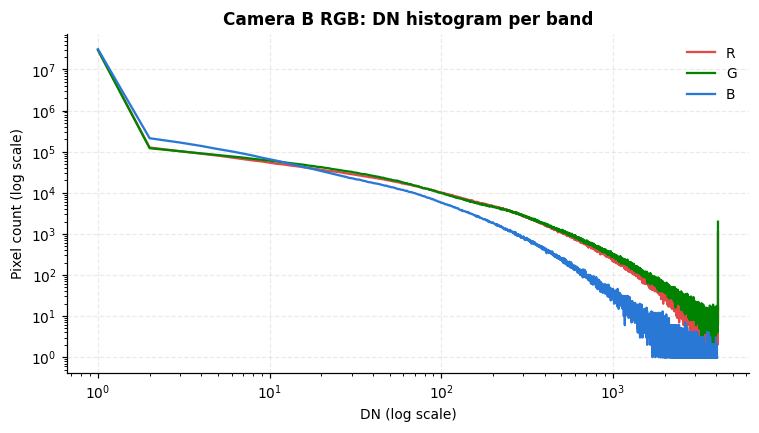

In [ ]:
fig, ax = plt.subplots(figsize=(8, 4))
bins = np.arange(1, 4097)
for i, band in enumerate("RGB"):
    c, _ = np.histogram(rgb_dn[i][valid_rgb], bins=bins)
    c = c.astype(float); c[c == 0] = np.nan
    ax.plot(bins[:-1], c, lw=1.5, color=BAND_COLORS[band], label=band)
ax.set_xscale("log"); ax.set_yscale("log")
ax.set_xlabel("DN (log scale)"); ax.set_ylabel("Pixel count (log scale)")
ax.set_title("Camera B RGB: DN histogram per band")
ax.legend(frameon=False)
savefig(fig, "05_rgb_histograms.png"); plt.show()

Blue is consistently the dimmest band at every brightness level, and green is the brightest. That fits a mix of warm (HPS, strong in red/green, little blue) and white LED sources. Because the absolute blue signal is small, **blue-based ratios will be noisy for dim pixels**, so we need a brightness threshold before using color.

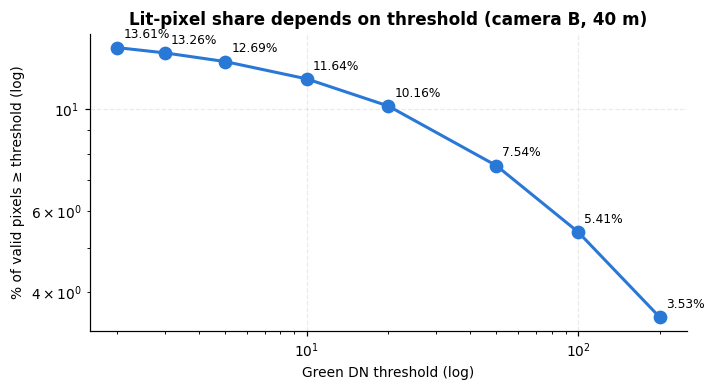

Pixels with all bands ≥ 20 DN: 1,646,181 (4.80% of valid)


In [ ]:
# how much of the scene counts as "lit" depends heavily on the threshold -> pick deliberately
thresholds = [2, 3, 5, 10, 20, 50, 100, 200]
lit_frac = [100 * (rgb_dn[1][valid_rgb] >= t).mean() for t in thresholds]

fig, ax = plt.subplots(figsize=(7, 3.5))
ax.plot(thresholds, lit_frac, "o-", color=C_A, lw=2, ms=8)
for t_, f_ in zip(thresholds, lit_frac):
    ax.annotate(f"{f_:.2f}%", (t_, f_), textcoords="offset points", xytext=(4, 6), fontsize=8)
ax.set_xscale("log"); ax.set_yscale("log")
ax.set_xlabel("Green DN threshold (log)"); ax.set_ylabel("% of valid pixels ≥ threshold (log)")
ax.set_title("Lit-pixel share depends on threshold (camera B, 40 m)")
savefig(fig, "05_lit_threshold.png"); plt.show()

LIT_DN = 20    # working threshold on every band for color analysis; revisit with the team
lit = valid_rgb & (rgb_dn >= LIT_DN).all(axis=0)
print(f"Pixels with all bands ≥ {LIT_DN} DN: {lit.sum():,} ({100*lit.sum()/valid_rgb.sum():.2f}% of valid)")

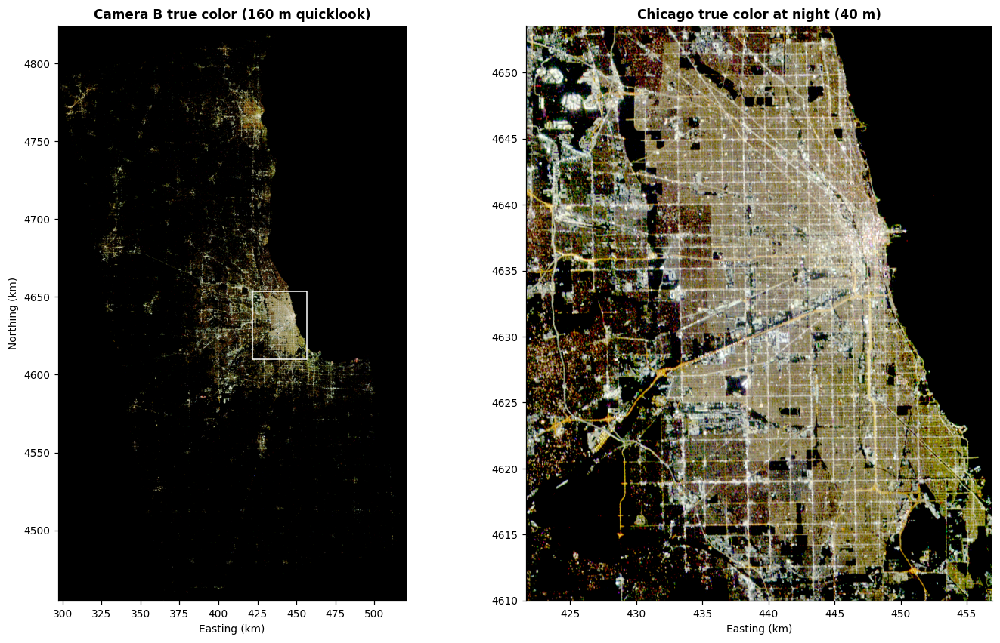

In [ ]:
def stretch_rgb(arr, lo=2, hi=99.8, mask=None, gamma=0.6):
    # Per-band percentile stretch + gamma so a night scene is visible to the eye.
    out = np.zeros(arr.shape[1:] + (3,), dtype="float32")
    m = mask if mask is not None else np.isfinite(arr[1])
    for i in range(3):
        v = np.log10(arr[i])
        a, b = np.nanpercentile(v[m], [lo, hi])
        out[..., i] = np.clip((v - a) / (b - a), 0, 1) ** gamma
    out[~np.isfinite(arr).all(axis=0)] = 0
    return out

# Chicago window of the RGB grid
r0, c0 = rio.transform.rowcol(rgb_tf, CHI_BBOX[0], CHI_BBOX[3])
r1, c1 = rio.transform.rowcol(rgb_tf, CHI_BBOX[2], CHI_BBOX[1])
sl = (slice(r0, r1), slice(c0, c1))
chi_rad = rgb_rad[:, sl[0], sl[1]]
chi_dn = rgb_dn[:, sl[0], sl[1]]
chi_lit = lit[sl]
cx0, cy1 = rio.transform.xy(rgb_tf, r0, c0, offset="ul")
cx1, cy0 = rio.transform.xy(rgb_tf, r1, c1, offset="ul")
chi_ext = (cx0, cx1, cy0, cy1)

fig, axes = plt.subplots(1, 2, figsize=(15, 9), gridspec_kw={"width_ratios": [1, 1.25]})
dec = 4
axes[0].imshow(stretch_rgb(rgb_rad[:, ::dec, ::dec], mask=lit[::dec, ::dec]), extent=[km(v) for v in rgb_ext])
axes[0].add_patch(Rectangle((km(x0), km(y0)), km(x1 - x0), km(y1 - y0), fill=False, ec="white", lw=1))
axes[0].set_title("Camera B true color (160 m quicklook)")
axes[1].imshow(stretch_rgb(chi_rad, mask=chi_lit), extent=[km(v) for v in chi_ext])
axes[1].set_title("Chicago true color at night (40 m)")
for ax in axes:
    ax.set_facecolor("black"); ax.grid(False); ax.set_xlabel("Easting (km)")
axes[0].set_ylabel("Northing (km)")
savefig(fig, "05_true_color.png"); plt.show()

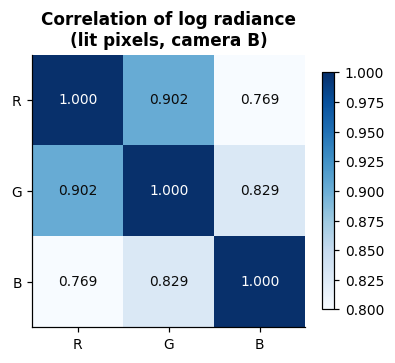

In [ ]:
# band-to-band correlation for lit pixels (log radiance)
lr = np.log10(rgb_rad[:, lit]).T
corr = pd.DataFrame(lr, columns=list("RGB")).corr()
fig, ax = plt.subplots(figsize=(4, 3.5))
im = ax.imshow(corr, cmap="Blues", vmin=0.8, vmax=1)
ax.set_xticks(range(3), list("RGB")); ax.set_yticks(range(3), list("RGB")); ax.grid(False)
for i in range(3):
    for j in range(3):
        ax.text(j, i, f"{corr.iloc[i, j]:.3f}", ha="center", va="center",
                color="white" if corr.iloc[i, j] > 0.95 else "#0b0b0b")
ax.set_title("Correlation of log radiance\n(lit pixels, camera B)")
plt.colorbar(im, ax=ax, shrink=0.8)
plt.show()

Brightness is shared across all three bands (correlations are high). **Light color lives in the residual variation between bands**, which is why the next section uses ratios, since ratios cancel out overall brightness.

### 6. Light color: band ratios as a lamp-type proxy
Common SDGSAT-1 color indices (computed on radiance):
- **B/G ratio**: higher means bluer/whiter light (typical of white LEDs, especially high-CCT ones); lower means warmer.
- **R/G ratio**: higher means redder/more orange (typical of high-pressure sodium).
- **Chromaticity** r = R/(R+G+B), b = B/(R+G+B): brightness-free color coordinates.

Context: Chicago's Smart Lighting Program converted most city streetlights from HPS to LED in roughly 2017–2021, so we expect city streets to look mostly "LED-like" and older or private lighting to look warmer. These are exploratory indices; turning them into lamp types needs ground truth (see discussion questions).

In [ ]:
with np.errstate(divide="ignore", invalid="ignore"):
    bg = np.where(lit, rgb_rad[2] / rgb_rad[1], np.nan)
    rg = np.where(lit, rgb_rad[0] / rgb_rad[1], np.nan)
    total = rgb_rad.sum(axis=0)
    chrom_r = np.where(lit, rgb_rad[0] / total, np.nan)
    chrom_b = np.where(lit, rgb_rad[2] / total, np.nan)

ratio_stats = pd.DataFrame({
    "B/G": pd.Series(bg[lit]).describe(percentiles=[.05, .25, .5, .75, .95]),
    "R/G": pd.Series(rg[lit]).describe(percentiles=[.05, .25, .5, .75, .95]),
    "r chrom.": pd.Series(chrom_r[lit]).describe(percentiles=[.05, .25, .5, .75, .95]),
    "b chrom.": pd.Series(chrom_b[lit]).describe(percentiles=[.05, .25, .5, .75, .95]),
})
ratio_stats.style.format(precision=3)

,B/G,R/G,r chrom.,b chrom.
count,1646181.000,1646181.000,1646181.000,1646181.000
mean,0.523,2.283,0.580,0.137
std,0.496,1.440,0.096,0.066
min,0.010,0.032,0.010,0.004
5%,0.195,1.128,0.416,0.054
25%,0.329,1.667,0.526,0.093
50%,0.442,2.061,0.585,0.126
75%,0.591,2.565,0.641,0.167
95%,1.076,3.960,0.726,0.257
max,160.446,181.372,0.983,0.965


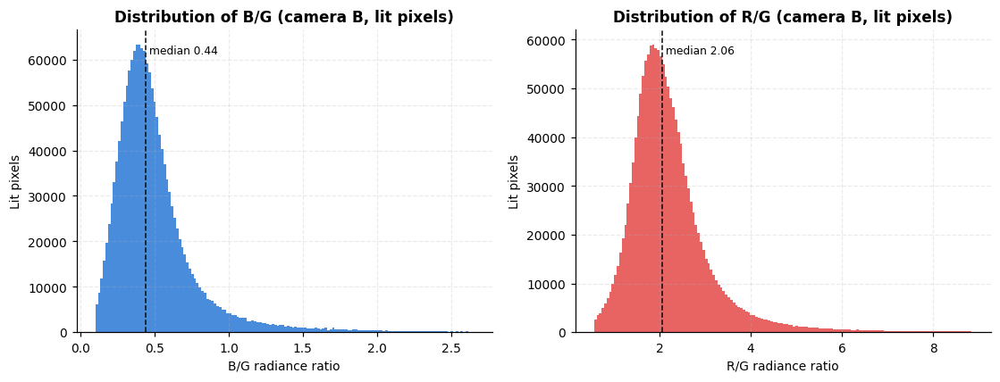

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for ax, (arr, name, color) in zip(axes, [(bg, "B/G radiance ratio", BAND_COLORS["B"]),
                                         (rg, "R/G radiance ratio", BAND_COLORS["R"])]):
    v = arr[lit]
    lo, hi = np.percentile(v, [0.5, 99.5])
    ax.hist(v, bins=150, range=(lo, hi), color=color, alpha=0.85)
    ax.axvline(np.median(v), color="#0b0b0b", lw=1, ls="--")
    ax.text(np.median(v), ax.get_ylim()[1] * 0.95, f" median {np.median(v):.2f}", va="top", fontsize=8)
    ax.set_xlabel(name); ax.set_ylabel("Lit pixels")
    ax.set_title(f"Distribution of {name.split()[0]} (camera B, lit pixels)")
savefig(fig, "06_ratio_histograms.png"); plt.show()

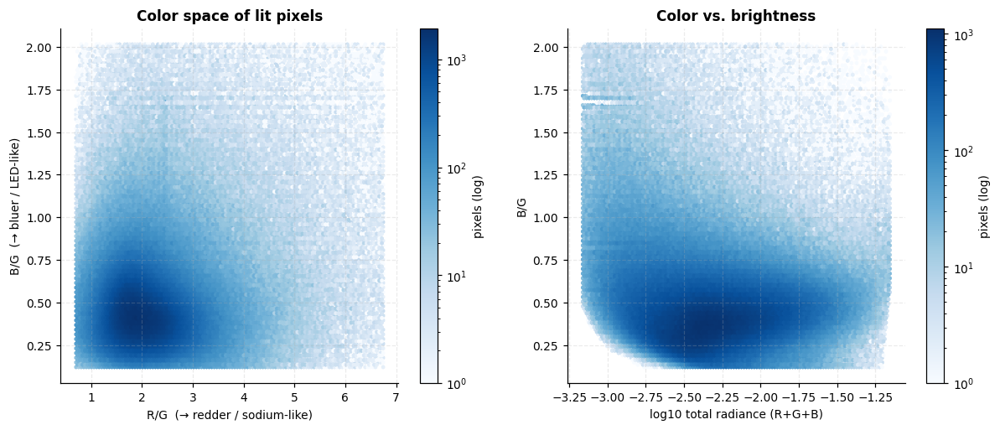

In [ ]:
# 2-D color space: clusters here would suggest distinct lamp families
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
v_rg, v_bg = rg[lit], bg[lit]
xr = np.percentile(v_rg, [1, 99]); yr = np.percentile(v_bg, [1, 99])
hb = axes[0].hexbin(v_rg, v_bg, gridsize=120, bins="log", cmap="Blues", mincnt=1, extent=(*xr, *yr))
axes[0].set_xlabel("R/G  (→ redder / sodium-like)"); axes[0].set_ylabel("B/G  (→ bluer / LED-like)")
axes[0].set_title("Color space of lit pixels")
plt.colorbar(hb, ax=axes[0], label="pixels (log)")

# color vs brightness: does color depend on how bright a pixel is?
bright = np.log10(total[lit])
hb2 = axes[1].hexbin(bright, v_bg, gridsize=120, bins="log", cmap="Blues", mincnt=1,
                     extent=(*np.percentile(bright, [0.5, 99.9]), *yr))
axes[1].set_xlabel("log10 total radiance (R+G+B)"); axes[1].set_ylabel("B/G")
axes[1].set_title("Color vs. brightness")
plt.colorbar(hb2, ax=axes[1], label="pixels (log)")
savefig(fig, "06_color_space.png"); plt.show()

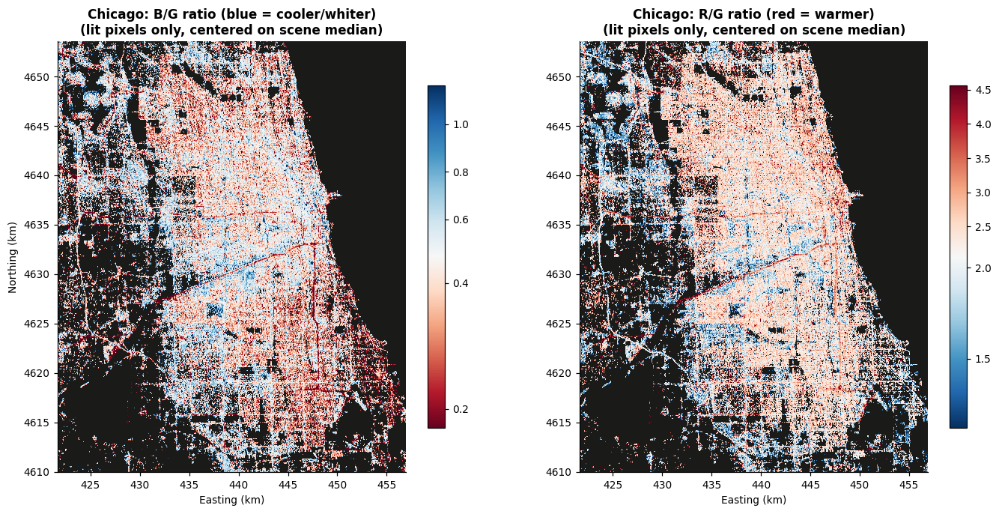

In [ ]:
# map of light color over Chicago
chi_bg = bg[sl]; chi_rg = rg[sl]
mid = np.nanmedian(bg[lit])
fig, axes = plt.subplots(1, 2, figsize=(15, 9))
for ax, (arr, name, center) in zip(axes, [(chi_bg, "B/G ratio (blue = cooler/whiter)", mid),
                                          (chi_rg, "R/G ratio (red = warmer)", np.nanmedian(rg[lit]))]):
    lo, hi = np.nanpercentile(arr, [2, 98])
    im = ax.imshow(arr, extent=[km(v) for v in chi_ext], cmap=RATIO_CMAP if "B/G" in name else "RdBu_r",
                   norm=TwoSlopeNorm(vcenter=center, vmin=min(lo, center * 0.99), vmax=max(hi, center * 1.01)),
                   interpolation="nearest")
    ax.set_facecolor("#1a1a19"); ax.grid(False)
    ax.set_title(f"Chicago: {name}\n(lit pixels only, centered on scene median)")
    ax.set_xlabel("Easting (km)")
    plt.colorbar(im, ax=ax, shrink=0.6)
axes[0].set_ylabel("Northing (km)")
savefig(fig, "06_chicago_color_maps.png"); plt.show()
# plot rgb lights separately 

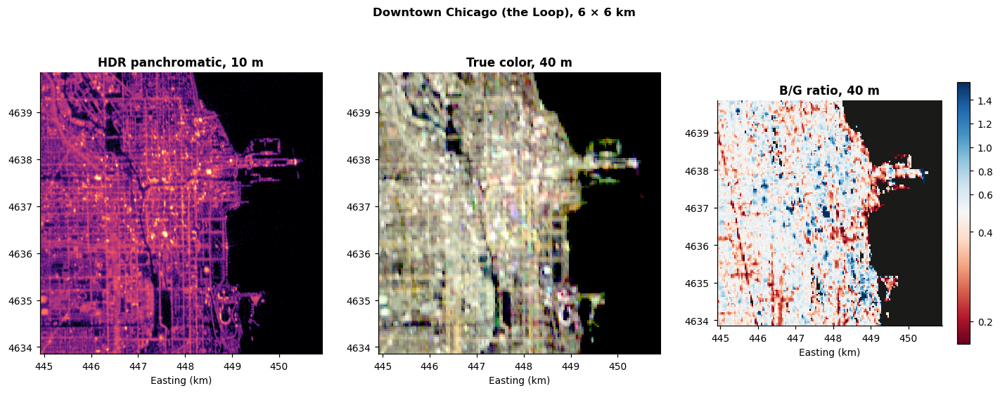

In [ ]:
# zoom: the Loop, 6 x 6 km, true color next to B/G
half = 3000
zb = (LOOP[0] - half, LOOP[1] - half, LOOP[0] + half, LOOP[1] + half)
zr0, zc0 = rio.transform.rowcol(rgb_tf, zb[0], zb[3]); zr1, zc1 = rio.transform.rowcol(rgb_tf, zb[2], zb[1])
zsl = (slice(zr0, zr1), slice(zc0, zc1))
z_ext = [km(v) for v in (zb[0], zb[2], zb[1], zb[3])]

with rio.open(b_lh) as src:
    zw = from_bounds(*zb, transform=src.transform)
    z_hdr = src.read(3, window=zw).astype("float32")
z_hdr[z_hdr == 0] = np.nan

fig, axes = plt.subplots(1, 3, figsize=(16, 5.5))
axes[0].imshow(z_hdr * CAL["HDR"][0] + CAL["HDR"][1], extent=z_ext, cmap=NTL_CMAP, norm=LogNorm())
axes[0].set_title("HDR panchromatic, 10 m")
axes[1].imshow(stretch_rgb(rgb_rad[:, zsl[0], zsl[1]], mask=lit[zsl]), extent=z_ext, interpolation="nearest")
axes[1].set_title("True color, 40 m")
im = axes[2].imshow(bg[zsl], extent=z_ext, cmap=RATIO_CMAP, interpolation="nearest",
                    norm=TwoSlopeNorm(vcenter=mid, vmin=np.nanpercentile(bg[lit], 2), vmax=np.nanpercentile(bg[lit], 98)))
axes[2].set_title("B/G ratio, 40 m")
plt.colorbar(im, ax=axes[2], shrink=0.8)
for ax in axes:
    ax.set_facecolor("#1a1a19"); ax.grid(False); ax.set_xlabel("Easting (km)")
fig.suptitle("Downtown Chicago (the Loop), 6 × 6 km", fontweight="bold")
savefig(fig, "06_loop_zoom.png"); plt.show()

**What the color maps suggest (first pass, from this run)**
- Lit pixels cluster around **B/G ≈ 0.44, R/G ≈ 2.1** (medians), with a long tail toward higher B/G. There is no clean two-cluster split, so pixel-level lamp classification will need more than one threshold. 40 m pixels mix several fixtures.
- **Expressways stand out as warm (low B/G, red)**, for example the diagonal I-55 corridor and the north–south expressways near the Loop, while the city street grid is cooler/whiter. One possible explanation: highway lighting is run by the state and was not part of the city's LED program. Worth checking.
- The Loop and some large sites (parking lots, rail yards, stadiums) show high B/G (blue) patches, consistent with bright white LED/metal-halide flood lighting.

### 7. Urban–rural gradient from the Loop
How brightness, lit share, and light color change with distance from downtown. Each measure gets its own panel (no shared y-axis).

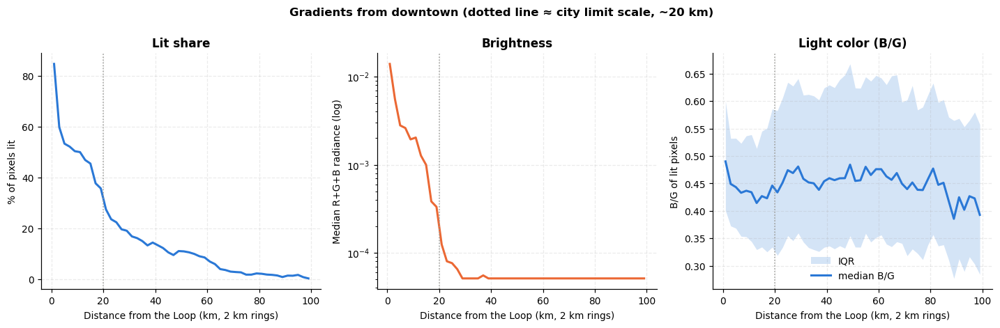

,lit_pct,med_rad,med_bg,q25_bg,q75_bg,med_rg,n_lit
ring,,,,,,,
1.000000,84.698,0.014,0.490,0.401,0.600,2.557,6653
3.000000,59.861,0.006,0.449,0.372,0.532,2.408,14102
5.000000,53.378,0.003,0.443,0.368,0.532,2.375,20968
7.000000,52.215,0.003,0.433,0.354,0.523,2.364,28704
9.000000,50.415,0.002,0.437,0.353,0.537,2.334,35636
11.000000,50.051,0.002,0.434,0.344,0.539,2.322,43241
13.000000,46.938,0.001,0.414,0.329,0.514,2.394,47929
15.000000,45.557,0.001,0.427,0.334,0.545,2.365,53667
17.000000,37.791,0.000,0.423,0.325,0.551,2.334,50452


In [ ]:
# pixel-center coordinates straight from the affine transform (fast, vectorized)
xs = rgb_tf.c + (np.arange(valid_rgb.shape[1]) + 0.5) * rgb_tf.a
ys = rgb_tf.f + (np.arange(valid_rgb.shape[0]) + 0.5) * rgb_tf.e
dist_km = (np.hypot(xs[None, :] - LOOP[0], ys[:, None] - LOOP[1]) / 1000).astype("float32")

grad = pd.DataFrame({
    "dist": dist_km[valid_rgb], "lit": lit[valid_rgb],
    "total": total[valid_rgb], "bg": bg[valid_rgb], "rg": rg[valid_rgb],
})
grad = grad[grad.dist <= 100]
grad["ring"] = (grad.dist // 2) * 2 + 1   # 2 km rings, labeled by midpoint
prof = grad.groupby("ring").agg(
    lit_pct=("lit", lambda s: 100 * s.mean()),
    med_rad=("total", lambda s: np.nanmedian(s)),
    med_bg=("bg", "median"), q25_bg=("bg", lambda s: s.quantile(.25)), q75_bg=("bg", lambda s: s.quantile(.75)),
    med_rg=("rg", "median"),
    n_lit=("lit", "sum"),
)
prof = prof[prof.n_lit >= 50]

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
axes[0].plot(prof.index, prof.lit_pct, color=C_A, lw=2)
axes[0].set_ylabel("% of pixels lit"); axes[0].set_title("Lit share")
axes[1].plot(prof.index, prof.med_rad, color=C_B, lw=2); axes[1].set_yscale("log")
axes[1].set_ylabel("Median R+G+B radiance (log)"); axes[1].set_title("Brightness")
axes[2].fill_between(prof.index, prof.q25_bg, prof.q75_bg, color=C_A, alpha=0.2, lw=0, label="IQR")
axes[2].plot(prof.index, prof.med_bg, color=C_A, lw=2, label="median B/G")
axes[2].set_ylabel("B/G of lit pixels"); axes[2].set_title("Light color (B/G)")
axes[2].legend(frameon=False)
for ax in axes:
    ax.set_xlabel("Distance from the Loop (km, 2 km rings)")
    ax.axvline(20, color="#9a9a96", lw=1, ls=":")
fig.suptitle("Gradients from downtown (dotted line ≈ city limit scale, ~20 km)", fontweight="bold", y=1.03)
savefig(fig, "07_gradients.png"); plt.show()
prof.head(12).style.format(precision=3)

### 8. Consistency checks
**8a. 10 m HDR vs. 40 m RGB.** The two products sit on different, offset grids (origins differ by ~697 m, which is not a multiple of 40 m). We resample HDR onto the RGB grid with *average* resampling and compare. This checks alignment and tells us whether the 10 m pan band can add spatial detail to the 40 m color.

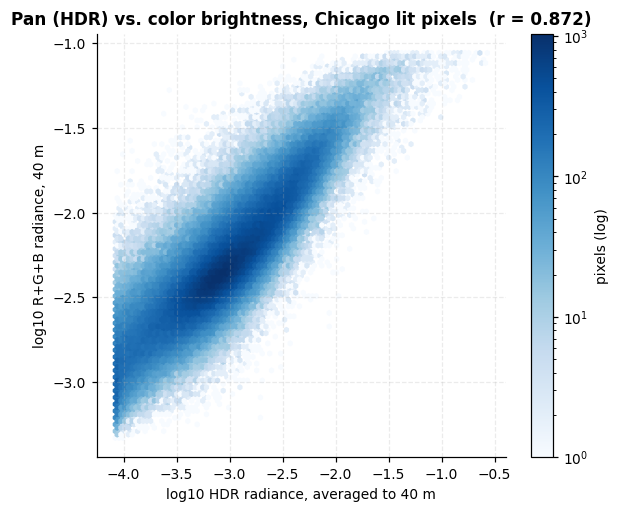

Correlation under ±1 pixel (40 m) shifts; the max should be at the center if the grids line up:


,col -1,col 0,col +1
row -1,0.6246,0.6541,0.4779
row 0,0.7823,0.8720,0.6020
row +1,0.7535,0.8561,0.6171


In [ ]:
hdr_rad_10m = np.where(np.isfinite(lh_chi[2]), lh_chi[2] * CAL["HDR"][0] + CAL["HDR"][1], np.nan).astype("float32")
chi_rgb_tf = rio.transform.from_origin(chi_ext[0], chi_ext[3], 40, 40)
hdr_on_rgb = np.full(chi_rad.shape[1:], np.nan, dtype="float32")
reproject(hdr_rad_10m, hdr_on_rgb, src_transform=lh_chi_tf, src_crs=CRS_UTM, src_nodata=np.nan,
          dst_transform=chi_rgb_tf, dst_crs=CRS_UTM, dst_nodata=np.nan, resampling=Resampling.average)

chi_total = chi_rad.sum(axis=0)
ok = np.isfinite(hdr_on_rgb) & chi_lit
x_, y_ = np.log10(hdr_on_rgb[ok]), np.log10(chi_total[ok])
r = np.corrcoef(x_, y_)[0, 1]

fig, ax = plt.subplots(figsize=(6, 5))
hb = ax.hexbin(x_, y_, gridsize=100, bins="log", cmap="Blues", mincnt=1)
ax.set_xlabel("log10 HDR radiance, averaged to 40 m"); ax.set_ylabel("log10 R+G+B radiance, 40 m")
ax.set_title(f"Pan (HDR) vs. color brightness, Chicago lit pixels  (r = {r:.3f})")
plt.colorbar(hb, ax=ax, label="pixels (log)")
savefig(fig, "08_hdr_vs_rgb.png"); plt.show()

# quick misregistration check: shift the RGB image by ±1 pixel and see if correlation improves
def corr_at(dr, dc):
    a = np.roll(np.roll(np.log10(chi_total), dr, 0), dc, 1)
    m = np.isfinite(hdr_on_rgb) & np.isfinite(a) & chi_lit
    return np.corrcoef(np.log10(hdr_on_rgb[m]), a[m])[0, 1]
shifts = pd.DataFrame([[corr_at(dr, dc) for dc in (-1, 0, 1)] for dr in (-1, 0, 1)],
                      index=["row -1", "row 0", "row +1"], columns=["col -1", "col 0", "col +1"])
print("Correlation under ±1 pixel (40 m) shifts; the max should be at the center if the grids line up:")
shifts.style.format("{:.4f}").highlight_max(axis=None, color="#cfe2f8")

**8b. Camera A vs. camera B overlap.** The two strips overlap by ~70 km in easting, west of Chicago. If both cameras measure the same color in the overlap, they can be mosaicked for a regional analysis.

Lit pixels seen by both cameras: 720


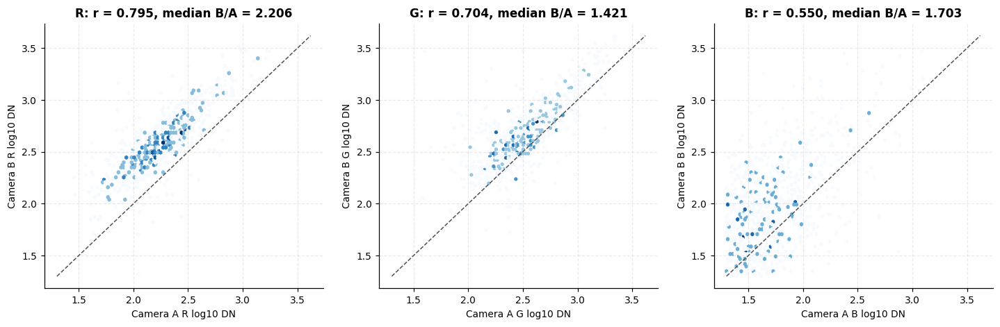

Median B/G in overlap: camera A 0.306 vs camera B 0.377


In [ ]:
with rio.open(a_rgb) as src:
    a_on_b = np.zeros_like(rgb_dn)
    reproject(src.read().astype("float32"), a_on_b, src_transform=src.transform, src_crs=src.crs, src_nodata=0,
              dst_transform=rgb_tf, dst_crs=CRS_UTM, dst_nodata=0, resampling=Resampling.nearest)

both = (a_on_b >= LIT_DN).all(axis=0) & (rgb_dn >= LIT_DN).all(axis=0)
print(f"Lit pixels seen by both cameras: {both.sum():,}")

fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
for i, band in enumerate("RGB"):
    xa, xb = np.log10(a_on_b[i][both]), np.log10(rgb_dn[i][both])
    axes[i].hexbin(xa, xb, gridsize=80, bins="log", cmap="Blues", mincnt=1)
    lim = [np.log10(LIT_DN), 3.62]; axes[i].plot(lim, lim, color="#52514e", ls="--", lw=1)
    axes[i].set_xlabel(f"Camera A {band} log10 DN"); axes[i].set_ylabel(f"Camera B {band} log10 DN")
    axes[i].set_title(f"{band}: r = {np.corrcoef(xa, xb)[0,1]:.3f}, median B/A = {np.median(10**(xb-xa)):.3f}")
savefig(fig, "08_camera_overlap.png"); plt.show()

bg_a = (a_on_b[2] * CAL["B"][0] + CAL["B"][1]) / (a_on_b[1] * CAL["G"][0] + CAL["G"][1])
print(f"Median B/G in overlap: camera A {np.median(bg_a[both]):.3f} vs camera B {np.median(bg[both]):.3f}")
del a_on_b

In this run the pan-vs-color correlation peaks at zero shift (r ≈ 0.87), so the 10 m and 40 m products line up to within a pixel. The camera overlap has few lit pixels (it is mostly rural), but **camera A gives a lower median B/G than camera B** for the same places. Treat cross-camera color comparisons with caution until a relative calibration is checked.

### 9. Data-quality notes
Saturation, bright outliers, and where they are.

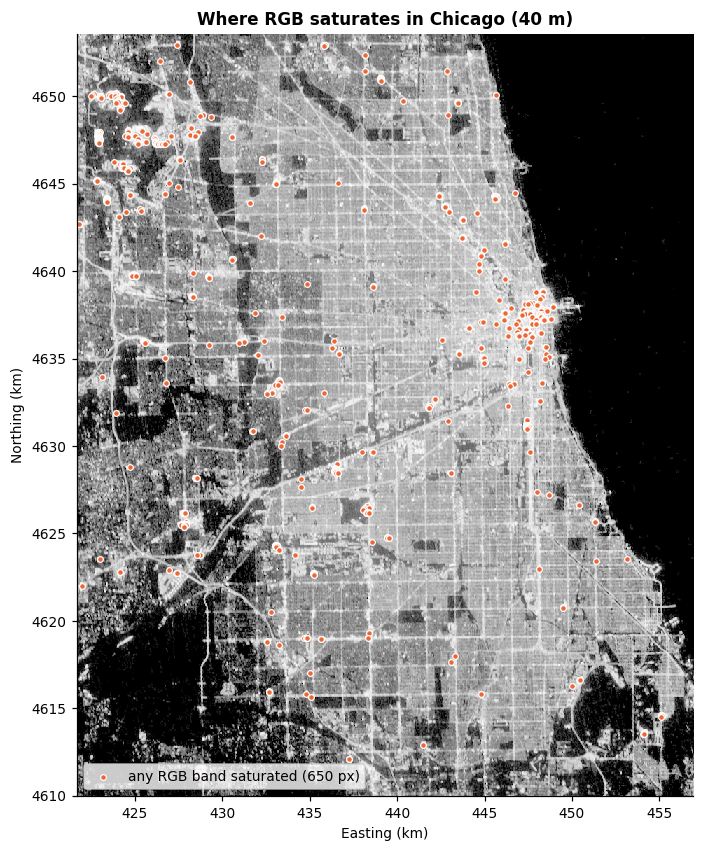

In [ ]:
sat_any = (chi_dn >= 4095).any(axis=0)
fig, ax = plt.subplots(figsize=(8, 9))
ax.imshow(np.log10(chi_total), extent=[km(v) for v in chi_ext], cmap="Greys_r", interpolation="nearest")
yy, xx = np.nonzero(sat_any)
sx, sy = rio.transform.xy(chi_rgb_tf, yy, xx)
ax.scatter(km(sx), km(sy), s=14, facecolor=C_B, edgecolor="white", lw=0.8, label=f"any RGB band saturated ({sat_any.sum()} px)")
ax.set_facecolor("black"); ax.grid(False)
ax.set_title("Where RGB saturates in Chicago (40 m)"); ax.legend(loc="lower left", frameon=True)
ax.set_xlabel("Easting (km)"); ax.set_ylabel("Northing (km)")
savefig(fig, "09_saturation.png"); plt.show()

- **Saturated pixels** are rare and cluster at known very bright sites. For light color, a saturated pixel has an unreliable ratio (the saturated band is clipped), so drop them from color analysis even if they stay in brightness analysis.
- The mosaic quicklook shows a **dashed red streak** in the west (camera A, well outside Chicago). It looks like a moving light source (for example an aircraft) imaged at slightly different times in each band, so it should be masked if we go regional.
- **Nodata = 0** is set in every TIFF; make sure it survives reprojection and DN → radiance steps (see the note in section 4).
- One date only (Sept 15, 2025, ~9:30 pm). Clouds, moon phase, and time-of-night effects can't be separated with a single scene.

### 10. Summary numbers

In [ ]:
summary = pd.Series({
    "Acquisition (local)": t_local.strftime("%Y-%m-%d %H:%M %Z"),
    "Products": "2 cameras × (10 m pan LH + 40 m RGB)",
    "Total data size": f"{inv.size_MB.sum()/1e3:.2f} GB",
    "Camera B LH valid pixels": f"{lh_stats.loc[('B','HDR'),'valid px (M)']:.0f} M (HDR); {lh_stats.loc[('B','HDR'),'DN=1 % (dark floor)']:.1f}% at dark floor",
    "Camera B RGB valid pixels": f"{valid_rgb.sum()/1e6:.1f} M",
    f"Lit pixels (all bands ≥ {LIT_DN} DN)": f"{lit.sum():,} ({100*lit.sum()/valid_rgb.sum():.2f}%)",
    "Lit pixels inside Chicago bbox": f"{chi_lit.sum():,}",
    "Median B/G (lit, camera B)": f"{np.nanmedian(bg[lit]):.3f}",
    "Median R/G (lit, camera B)": f"{np.nanmedian(rg[lit]):.3f}",
    "HDR vs RGB brightness r (Chicago)": f"{r:.3f}",
    "Saturated RGB px in Chicago": int(sat_any.sum()),
}, name="value")
summary.to_frame()

,value
Acquisition (local),2025-09-15 21:31 CDT
Products,2 cameras × (10 m pan LH + 40 m RGB)
Total data size,0.30 GB
Camera B LH valid pixels,553 M (HDR); 94.1% at dark floor
Camera B RGB valid pixels,34.3 M
Lit pixels (all bands ≥ 20 DN),"1,646,181 (4.80%)"
Lit pixels inside Chicago bbox,"500,253"
"Median B/G (lit, camera B)",0.442
"Median R/G (lit, camera B)",2.061
HDR vs RGB brightness r (Chicago),0.872


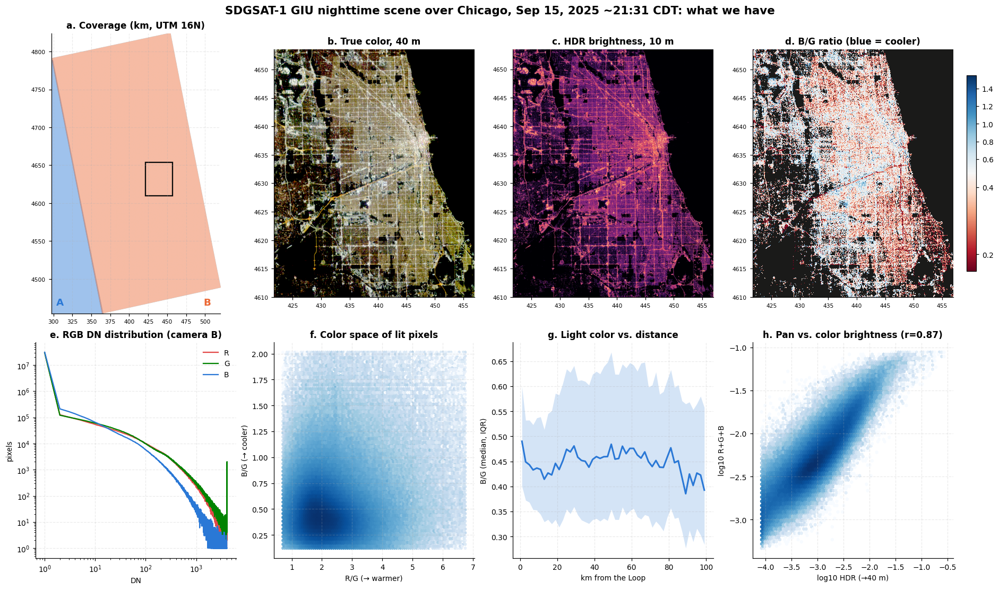

In [ ]:
# one-page overview figure for the meeting
fig = plt.figure(figsize=(17, 10), layout="constrained")
gs = fig.add_gridspec(2, 4, height_ratios=[1.3, 1])

ax = fig.add_subplot(gs[0, 0])
for label, color in [("A", C_A), ("B", C_B)]:
    m, ext = cov[label]
    ax.imshow(np.where(m, 1.0, np.nan), extent=[km(v) for v in ext], cmap=mpl.colors.ListedColormap([color]), alpha=0.45)
ax.add_patch(Rectangle((km(x0), km(y0)), km(x1 - x0), km(y1 - y0), fill=False, ec="#0b0b0b", lw=1.5))
ax.set_title("a. Coverage (km, UTM 16N)"); ax.set_aspect("equal"); ax.tick_params(labelsize=7)
ax.text(0.03, 0.03, "A", color=C_A, transform=ax.transAxes, fontweight="bold", fontsize=12)
ax.text(0.9, 0.03, "B", color=C_B, transform=ax.transAxes, fontweight="bold", fontsize=12)

ax = fig.add_subplot(gs[0, 1])
ax.imshow(stretch_rgb(chi_rad, mask=chi_lit), extent=[km(v) for v in chi_ext])
ax.set_facecolor("black"); ax.grid(False); ax.set_title("b. True color, 40 m"); ax.tick_params(labelsize=7)

ax = fig.add_subplot(gs[0, 2])
ax.imshow(np.log10(hdr_rad_10m), extent=[km(v) for v in lh_ext], cmap=NTL_CMAP,
          vmin=np.nanpercentile(np.log10(hdr_rad_10m), 5), vmax=np.nanpercentile(np.log10(hdr_rad_10m), 99.9))
ax.set_facecolor("#1a1a19"); ax.grid(False); ax.set_title("c. HDR brightness, 10 m"); ax.tick_params(labelsize=7)

ax = fig.add_subplot(gs[0, 3])
im = ax.imshow(chi_bg, extent=[km(v) for v in chi_ext], cmap=RATIO_CMAP, interpolation="nearest",
               norm=TwoSlopeNorm(vcenter=mid, vmin=np.nanpercentile(bg[lit], 2), vmax=np.nanpercentile(bg[lit], 98)))
ax.set_facecolor("#1a1a19"); ax.grid(False); ax.set_title("d. B/G ratio (blue = cooler)"); ax.tick_params(labelsize=7)
plt.colorbar(im, ax=ax, shrink=0.7)

ax = fig.add_subplot(gs[1, 0])
for i, band in enumerate("RGB"):
    c, _ = np.histogram(rgb_dn[i][valid_rgb], bins=bins); c = c.astype(float); c[c == 0] = np.nan
    ax.plot(bins[:-1], c, lw=1.5, color=BAND_COLORS[band], label=band)
ax.set_xscale("log"); ax.set_yscale("log"); ax.legend(frameon=False)
ax.set_xlabel("DN"); ax.set_ylabel("pixels"); ax.set_title("e. RGB DN distribution (camera B)")

ax = fig.add_subplot(gs[1, 1])
ax.hexbin(v_rg, v_bg, gridsize=90, bins="log", cmap="Blues", mincnt=1, extent=(*xr, *yr))
ax.set_xlabel("R/G (→ warmer)"); ax.set_ylabel("B/G (→ cooler)"); ax.set_title("f. Color space of lit pixels")

ax = fig.add_subplot(gs[1, 2])
ax.fill_between(prof.index, prof.q25_bg, prof.q75_bg, color=C_A, alpha=0.2, lw=0)
ax.plot(prof.index, prof.med_bg, color=C_A, lw=2)
ax.set_xlabel("km from the Loop"); ax.set_ylabel("B/G (median, IQR)"); ax.set_title("g. Light color vs. distance")

ax = fig.add_subplot(gs[1, 3])
ax.hexbin(x_, y_, gridsize=80, bins="log", cmap="Blues", mincnt=1)
ax.set_xlabel("log10 HDR (→40 m)"); ax.set_ylabel("log10 R+G+B"); ax.set_title(f"h. Pan vs. color brightness (r={r:.2f})")

fig.suptitle(f"SDGSAT-1 GIU nighttime scene over Chicago, {t_local:%b %d, %Y ~%H:%M %Z}: what we have",
             fontsize=14, fontweight="bold")
savefig(fig, "00_data_overview.png"); plt.show()

### 11. Discussion questions for the project meeting
**Scope and data**
1. Is this single scene (Sept 15, 2025) the whole dataset, or will more SDGSAT-1 dates come (seasonal comparison, before/after LED conversion)?
2. City of Chicago only, or the full metro/regional extent (would need the A + B mosaic)?
3. Should the light-color layer feed into the bird-collision model, like NTL and building density in the mentor notebook, and at the same 100 m grid with 500 m / 1000 m windows?

**Method**
4. Which color index: B/G, R/G, chromaticity, or a classifier (HPS / LED / other)? Do we have **ground truth**, for example Chicago's streetlight inventory or data from the Smart Lighting Program?
5. Lit-pixel threshold (currently all bands ≥ 20 DN): what value, and should it be tied to a noise estimate over dark areas or the lake?
6. How to use the 10 m pan band with the 40 m color bands (pan-sharpening, or keep them separate)?

**Data quality to confirm**
7. RGB band-center order in `calib.xml` looks swapped versus the GIU spec. Does that matter for calibration?
8. HDR gain/bias: is averaging PL and PH correct?
9. The DN = 0 nodata issue in the mentor pipeline's whole-scene stats.
10. Camera A vs. B color offset in the overlap: does a relative calibration step belong in the pipeline if we go regional?
11. How should saturated pixels be handled for color? Current plan: exclude from ratios, keep for brightness.